In [1]:


import numpy as np


In [2]:
import math
from time import sleep
reach_threshold = 0.1
dis_threshold = 0.1
def convert_angle(delta_x,delta_y):
    if(delta_x == 0):      #special case when x = 0 
        if(delta_y == 0):          #reach the destination
            return None
        elif(delta_y > 0):     
            return 90
        else:
            return -90
    temp = delta_y / delta_x
    
    if(delta_x > 0): #in case from -90 to 90 degree
        return math.degrees(math.atan(temp))
    else:
        
        if(delta_y > 0):  #case for 90 to 180 degree
            return 180 + math.degrees(math.atan(temp))
        else:       #case for -180 to -90 degree
            return math.degrees(math.atan(temp)) + 180 - 360
        
        
def update_info_straight(curr_x,curr_y,curr_angle, time):    #for keep space
    speed = 1       #currently defalut 1, can use calibration to change that
    curr_x = curr_x + math.cos(math.radians(curr_angle)) * time * speed
    curr_y = curr_y + math.sin(math.radians(curr_angle)) * time * speed

    return curr_x,curr_y

def reach_destination(curr_x, x, curr_y, y):  
    distance_apart = math.sqrt((curr_x - x)**2 + (curr_y - y)**2)       #use to calculate the distance from the destination to current lcoation
    
    if(distance_apart < dis_threshold): #within a range, then it mean it is close to the destination, then it return true.
        return True
    else:
        return False
    
def check_angle(angle):     #use to convert the angle to be between -180 to 180 degree
    if(angle > 180):
        return -180 + angle - 180
    elif(angle < -180):
        return 180 + angle + 180
    else:
        return angle

In [3]:
curr_x = -2          #use to keep track on the x of the car current status
curr_y = 0        #use to keep track on the y of the car current status
curr_angle = 0      #use to keep track on the angle of the car current status, range from -180 to 180. 0 indicate straight
des_x = 1
des_y = 0
spin_time = 0.5

In [4]:
import math

def has_obstacle(x, y, angle):
    if x <= -1:
        if y + (-1-x) * math.tan(angle) > 1 :
            return False
        if y + (-1-x) * math.tan(angle) < -1 :
            return False
        dis = (-1-x)/ math.cos(angle)
    else:
        return False
    
    if dis < 0.5:
        return True
    else:
        return False

In [5]:

    
def update(prob_blocked):
    global curr_x, curr_y, curr_angle 
    global des_x, des_y, spin_time
    
    
    if not des_x or not des_y:
        print("hahaha")
    
    if reach_destination(curr_x, des_x, curr_y, des_y):
        #camera.unobserve(update, names='value')
        print("stop")
        #robot.stop()

    print("current location", curr_x, curr_y, curr_angle)
    x_array.append(curr_x)
    y_array.append(curr_y)
    # we apply the `softmax` function to normalize the output vector so it sums to 1 (which makes it a probability distribution)
    
 
    
    if not has_obstacle(curr_x, curr_y, curr_angle): #if no object
        target_angle = convert_angle(des_x - curr_x, des_y - curr_y)
        angle_diff = target_angle - curr_angle
        print(target_angle)
        if abs(angle_diff) > 0.02: 
                #not pointing at the correct angle 
                #adjust to the left while going straight if angle is negative and right if angle is positive

            #time_to_turn = spin_time / abs(angle_different)     #calculate how long does the spin need to be
            curr_x, curr_y = update_info_straight(curr_x,curr_y,curr_angle, 0.01) 
            #sleep(time_to_turn)     #sleep to wait until the car turn enough
            curr_angle = target_angle    #x and y did not change, only the angle change to the target value in this case.
        else:
            #go straight 
            #straight()
            #sleep(0.1)
            curr_x, curr_y = update_info_straight(curr_x,curr_y,curr_angle, 0.0001)   

            
    else:
        #spin_left()
        #sleep(0.1)
        curr_angle = check_angle(curr_angle + 0.5)  #make sure the angle is between -180 to 180 degree
        #straight()
        #sleep(0.5)
        #curr_x, curr_y = update_info_straight(curr_x, curr_y,curr_angle,0.1)
        
    
        
        


In [6]:
line_x_array = []
line_y_array = []
for i in (-1, 1, 0.00001):
    line_x_array.append(-1)
    line_y_array.append(i)
    
    

In [7]:
curr_x = -2          #use to keep track on the x of the car current status
curr_y = 0        #use to keep track on the y of the car current status
curr_angle = 0      #use to keep track on the angle of the car current status, range from -180 to 180. 0 indicate straight
des_x = 1
des_y = 0
spin_time = 0.5
x_array = []
y_array = []
prob = 0.3

for i in range(100000):
    prob = 0.3
    
    
    update(prob)

hahaha
current location -2 0 0
0.0
hahaha
current location -1.9999 0.0 0
0.0
hahaha
current location -1.9998 0.0 0
0.0
hahaha
current location -1.9997 0.0 0
0.0
hahaha
current location -1.9996 0.0 0
0.0
hahaha
current location -1.9995 0.0 0
0.0
hahaha
current location -1.9994 0.0 0
0.0
hahaha
current location -1.9993 0.0 0
0.0
hahaha
current location -1.9992 0.0 0
0.0
hahaha
current location -1.9991 0.0 0
0.0
hahaha
current location -1.999 0.0 0
0.0
hahaha
current location -1.9989000000000001 0.0 0
0.0
hahaha
current location -1.9988000000000001 0.0 0
0.0
hahaha
current location -1.9987000000000001 0.0 0
0.0
hahaha
current location -1.9986000000000002 0.0 0
0.0
hahaha
current location -1.9985000000000002 0.0 0
0.0
hahaha
current location -1.9984000000000002 0.0 0
0.0
hahaha
current location -1.9983000000000002 0.0 0
0.0
hahaha
current location -1.9982000000000002 0.0 0
0.0
hahaha
current location -1.9981000000000002 0.0 0
0.0
hahaha
current location -1.9980000000000002 0.0 0
0.0
hahaha

current location -1.9520000000000053 0.0 0
0.0
hahaha
current location -1.9519000000000053 0.0 0
0.0
hahaha
current location -1.9518000000000053 0.0 0
0.0
hahaha
current location -1.9517000000000053 0.0 0
0.0
hahaha
current location -1.9516000000000053 0.0 0
0.0
hahaha
current location -1.9515000000000053 0.0 0
0.0
hahaha
current location -1.9514000000000054 0.0 0
0.0
hahaha
current location -1.9513000000000054 0.0 0
0.0
hahaha
current location -1.9512000000000054 0.0 0
0.0
hahaha
current location -1.9511000000000054 0.0 0
0.0
hahaha
current location -1.9510000000000054 0.0 0
0.0
hahaha
current location -1.9509000000000054 0.0 0
0.0
hahaha
current location -1.9508000000000054 0.0 0
0.0
hahaha
current location -1.9507000000000054 0.0 0
0.0
hahaha
current location -1.9506000000000054 0.0 0
0.0
hahaha
current location -1.9505000000000055 0.0 0
0.0
hahaha
current location -1.9504000000000055 0.0 0
0.0
hahaha
current location -1.9503000000000055 0.0 0
0.0
hahaha
current location -1.95020000

0.0
hahaha
current location -1.9054000000000104 0.0 0
0.0
hahaha
current location -1.9053000000000104 0.0 0
0.0
hahaha
current location -1.9052000000000104 0.0 0
0.0
hahaha
current location -1.9051000000000105 0.0 0
0.0
hahaha
current location -1.9050000000000105 0.0 0
0.0
hahaha
current location -1.9049000000000105 0.0 0
0.0
hahaha
current location -1.9048000000000105 0.0 0
0.0
hahaha
current location -1.9047000000000105 0.0 0
0.0
hahaha
current location -1.9046000000000105 0.0 0
0.0
hahaha
current location -1.9045000000000105 0.0 0
0.0
hahaha
current location -1.9044000000000105 0.0 0
0.0
hahaha
current location -1.9043000000000105 0.0 0
0.0
hahaha
current location -1.9042000000000106 0.0 0
0.0
hahaha
current location -1.9041000000000106 0.0 0
0.0
hahaha
current location -1.9040000000000106 0.0 0
0.0
hahaha
current location -1.9039000000000106 0.0 0
0.0
hahaha
current location -1.9038000000000106 0.0 0
0.0
hahaha
current location -1.9037000000000106 0.0 0
0.0
hahaha
current location 

0.0
hahaha
current location -1.8536000000000161 0.0 0
0.0
hahaha
current location -1.8535000000000161 0.0 0
0.0
hahaha
current location -1.8534000000000161 0.0 0
0.0
hahaha
current location -1.8533000000000162 0.0 0
0.0
hahaha
current location -1.8532000000000162 0.0 0
0.0
hahaha
current location -1.8531000000000162 0.0 0
0.0
hahaha
current location -1.8530000000000162 0.0 0
0.0
hahaha
current location -1.8529000000000162 0.0 0
0.0
hahaha
current location -1.8528000000000162 0.0 0
0.0
hahaha
current location -1.8527000000000162 0.0 0
0.0
hahaha
current location -1.8526000000000162 0.0 0
0.0
hahaha
current location -1.8525000000000162 0.0 0
0.0
hahaha
current location -1.8524000000000163 0.0 0
0.0
hahaha
current location -1.8523000000000163 0.0 0
0.0
hahaha
current location -1.8522000000000163 0.0 0
0.0
hahaha
current location -1.8521000000000163 0.0 0
0.0
hahaha
current location -1.8520000000000163 0.0 0
0.0
hahaha
current location -1.8519000000000163 0.0 0
0.0
hahaha
current location 

current location -1.8217000000000196 0.0 0
0.0
hahaha
current location -1.8216000000000196 0.0 0
0.0
hahaha
current location -1.8215000000000197 0.0 0
0.0
hahaha
current location -1.8214000000000197 0.0 0
0.0
hahaha
current location -1.8213000000000197 0.0 0
0.0
hahaha
current location -1.8212000000000197 0.0 0
0.0
hahaha
current location -1.8211000000000197 0.0 0
0.0
hahaha
current location -1.8210000000000197 0.0 0
0.0
hahaha
current location -1.8209000000000197 0.0 0
0.0
hahaha
current location -1.8208000000000197 0.0 0
0.0
hahaha
current location -1.8207000000000197 0.0 0
0.0
hahaha
current location -1.8206000000000198 0.0 0
0.0
hahaha
current location -1.8205000000000198 0.0 0
0.0
hahaha
current location -1.8204000000000198 0.0 0
0.0
hahaha
current location -1.8203000000000198 0.0 0
0.0
hahaha
current location -1.8202000000000198 0.0 0
0.0
hahaha
current location -1.8201000000000198 0.0 0
0.0
hahaha
current location -1.8200000000000198 0.0 0
0.0
hahaha
current location -1.81990000

current location -1.7784000000000244 0.0 0
0.0
hahaha
current location -1.7783000000000244 0.0 0
0.0
hahaha
current location -1.7782000000000244 0.0 0
0.0
hahaha
current location -1.7781000000000244 0.0 0
0.0
hahaha
current location -1.7780000000000244 0.0 0
0.0
hahaha
current location -1.7779000000000245 0.0 0
0.0
hahaha
current location -1.7778000000000245 0.0 0
0.0
hahaha
current location -1.7777000000000245 0.0 0
0.0
hahaha
current location -1.7776000000000245 0.0 0
0.0
hahaha
current location -1.7775000000000245 0.0 0
0.0
hahaha
current location -1.7774000000000245 0.0 0
0.0
hahaha
current location -1.7773000000000245 0.0 0
0.0
hahaha
current location -1.7772000000000245 0.0 0
0.0
hahaha
current location -1.7771000000000245 0.0 0
0.0
hahaha
current location -1.7770000000000246 0.0 0
0.0
hahaha
current location -1.7769000000000246 0.0 0
0.0
hahaha
current location -1.7768000000000246 0.0 0
0.0
hahaha
current location -1.7767000000000246 0.0 0
0.0
hahaha
current location -1.77660000

current location -1.7385000000000288 0.0 0
0.0
hahaha
current location -1.7384000000000288 0.0 0
0.0
hahaha
current location -1.7383000000000288 0.0 0
0.0
hahaha
current location -1.7382000000000288 0.0 0
0.0
hahaha
current location -1.7381000000000288 0.0 0
0.0
hahaha
current location -1.7380000000000289 0.0 0
0.0
hahaha
current location -1.7379000000000289 0.0 0
0.0
hahaha
current location -1.7378000000000289 0.0 0
0.0
hahaha
current location -1.7377000000000289 0.0 0
0.0
hahaha
current location -1.737600000000029 0.0 0
0.0
hahaha
current location -1.737500000000029 0.0 0
0.0
hahaha
current location -1.737400000000029 0.0 0
0.0
hahaha
current location -1.737300000000029 0.0 0
0.0
hahaha
current location -1.737200000000029 0.0 0
0.0
hahaha
current location -1.737100000000029 0.0 0
0.0
hahaha
current location -1.737000000000029 0.0 0
0.0
hahaha
current location -1.736900000000029 0.0 0
0.0
hahaha
current location -1.736800000000029 0.0 0
0.0
hahaha
current location -1.736700000000029 0

hahaha
current location -1.6925000000000339 0.0 0
0.0
hahaha
current location -1.6924000000000339 0.0 0
0.0
hahaha
current location -1.6923000000000339 0.0 0
0.0
hahaha
current location -1.692200000000034 0.0 0
0.0
hahaha
current location -1.692100000000034 0.0 0
0.0
hahaha
current location -1.692000000000034 0.0 0
0.0
hahaha
current location -1.691900000000034 0.0 0
0.0
hahaha
current location -1.691800000000034 0.0 0
0.0
hahaha
current location -1.691700000000034 0.0 0
0.0
hahaha
current location -1.691600000000034 0.0 0
0.0
hahaha
current location -1.691500000000034 0.0 0
0.0
hahaha
current location -1.691400000000034 0.0 0
0.0
hahaha
current location -1.691300000000034 0.0 0
0.0
hahaha
current location -1.691200000000034 0.0 0
0.0
hahaha
current location -1.691100000000034 0.0 0
0.0
hahaha
current location -1.691000000000034 0.0 0
0.0
hahaha
current location -1.690900000000034 0.0 0
0.0
hahaha
current location -1.690800000000034 0.0 0
0.0
hahaha
current location -1.690700000000034 

current location -1.6490000000000387 0.0 0
0.0
hahaha
current location -1.6489000000000387 0.0 0
0.0
hahaha
current location -1.6488000000000387 0.0 0
0.0
hahaha
current location -1.6487000000000387 0.0 0
0.0
hahaha
current location -1.6486000000000387 0.0 0
0.0
hahaha
current location -1.6485000000000387 0.0 0
0.0
hahaha
current location -1.6484000000000387 0.0 0
0.0
hahaha
current location -1.6483000000000387 0.0 0
0.0
hahaha
current location -1.6482000000000387 0.0 0
0.0
hahaha
current location -1.6481000000000388 0.0 0
0.0
hahaha
current location -1.6480000000000388 0.0 0
0.0
hahaha
current location -1.6479000000000388 0.0 0
0.0
hahaha
current location -1.6478000000000388 0.0 0
0.0
hahaha
current location -1.6477000000000388 0.0 0
0.0
hahaha
current location -1.6476000000000388 0.0 0
0.0
hahaha
current location -1.6475000000000388 0.0 0
0.0
hahaha
current location -1.6474000000000388 0.0 0
0.0
hahaha
current location -1.6473000000000388 0.0 0
0.0
hahaha
current location -1.64720000

hahaha
current location -1.599800000000044 0.0 0
0.0
hahaha
current location -1.599700000000044 0.0 0
0.0
hahaha
current location -1.599600000000044 0.0 0
0.0
hahaha
current location -1.599500000000044 0.0 0
0.0
hahaha
current location -1.5994000000000441 0.0 0
0.0
hahaha
current location -1.5993000000000441 0.0 0
0.0
hahaha
current location -1.5992000000000441 0.0 0
0.0
hahaha
current location -1.5991000000000442 0.0 0
0.0
hahaha
current location -1.5990000000000442 0.0 0
0.0
hahaha
current location -1.5989000000000442 0.0 0
0.0
hahaha
current location -1.5988000000000442 0.0 0
0.0
hahaha
current location -1.5987000000000442 0.0 0
0.0
hahaha
current location -1.5986000000000442 0.0 0
0.0
hahaha
current location -1.5985000000000442 0.0 0
0.0
hahaha
current location -1.5984000000000442 0.0 0
0.0
hahaha
current location -1.5983000000000442 0.0 0
0.0
hahaha
current location -1.5982000000000443 0.0 0
0.0
hahaha
current location -1.5981000000000443 0.0 0
0.0
hahaha
current location -1.59800

current location -1.5481000000000498 0.0 0
0.0
hahaha
current location -1.5480000000000498 0.0 0
0.0
hahaha
current location -1.5479000000000498 0.0 0
0.0
hahaha
current location -1.5478000000000498 0.0 0
0.0
hahaha
current location -1.5477000000000498 0.0 0
0.0
hahaha
current location -1.5476000000000498 0.0 0
0.0
hahaha
current location -1.5475000000000498 0.0 0
0.0
hahaha
current location -1.5474000000000498 0.0 0
0.0
hahaha
current location -1.5473000000000499 0.0 0
0.0
hahaha
current location -1.5472000000000499 0.0 0
0.0
hahaha
current location -1.5471000000000499 0.0 0
0.0
hahaha
current location -1.54700000000005 0.0 0
0.0
hahaha
current location -1.54690000000005 0.0 0
0.0
hahaha
current location -1.54680000000005 0.0 0
0.0
hahaha
current location -1.54670000000005 0.0 0
0.0
hahaha
current location -1.54660000000005 0.0 0
0.0
hahaha
current location -1.54650000000005 0.0 0
0.0
hahaha
current location -1.54640000000005 0.0 0
0.0
hahaha
current location -1.54630000000005 0.0 0
0

current location -1.500900000000055 0.0 0
0.0
hahaha
current location -1.500800000000055 0.0 0
0.0
hahaha
current location -1.500700000000055 0.0 0
0.0
hahaha
current location -1.500600000000055 0.0 0
0.0
hahaha
current location -1.500500000000055 0.0 0
0.0
hahaha
current location -1.500400000000055 0.0 0
0.0
hahaha
current location -1.500300000000055 0.0 0
0.0
hahaha
current location -1.500200000000055 0.0 0
0.0
hahaha
current location -1.500100000000055 0.0 0
0.0
hahaha
current location -1.500000000000055 0.0 0
0.0
hahaha
current location -1.499900000000055 0.0 0
hahaha
current location -1.499900000000055 0.0 0.5
0.0
hahaha
current location -1.4899003807694133 8.726535498373934e-05 0.0
hahaha
current location -1.4899003807694133 8.726535498373934e-05 0.5
-0.0020080869800449316
hahaha
current location -1.4799007615387716 0.00017453070996747868 -0.0020080869800449316
hahaha
current location -1.4799007615387716 0.00017453070996747868 0.49799191301995505
-0.004032368236317423
hahaha
curr

current location -1.0024658557770316 0.02433486169607584 33.96170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 34.46170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 34.96170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 35.46170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 35.96170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 36.46170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 36.96170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 37.46170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 37.96170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 38.46170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 38.96170531504693
hahaha
current location -1.0024658557770316 0.02433486169607584 39.46170531504693
hahaha
current location

current location -1.0116619814378873 0.04066686537359457 70.52193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 71.02193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 71.52193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 72.02193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 72.52193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 73.02193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 73.52193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 74.02193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 74.52193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 75.02193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 75.52193867522669
hahaha
current location -1.0116619814378873 0.04066686537359457 76.02193867522669
hahaha
current location

current location -1.0016720614898966 0.05203091648125924 -175.44282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -174.94282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -174.44282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -173.94282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -173.44282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -172.94282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -172.44282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -171.94282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -171.44282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -170.94282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -170.44282904285512
hahaha
current location -1.0016720614898966 0.05203091648125924 -169.94282904285512

current location -0.9580482450405906 0.04692422770616871 -1.3725068411758126
-1.372818927339396
hahaha
current location -0.9579482737307531 0.04692183245892331 -1.3725068411758126
-1.37281894327427
hahaha
current location -0.9578483024209156 0.04691943721167791 -1.3725068411758126
-1.372818959210771
hahaha
current location -0.957748331111078 0.04691704196443251 -1.3725068411758126
-1.3728189751488995
hahaha
current location -0.9576483598012405 0.04691464671718711 -1.3725068411758126
-1.372818991088656
hahaha
current location -0.957548388491403 0.04691225146994171 -1.3725068411758126
-1.3728190070300403
hahaha
current location -0.9574484171815655 0.04690985622269631 -1.3725068411758126
-1.3728190229730535
hahaha
current location -0.957348445871728 0.04690746097545091 -1.3725068411758126
-1.3728190389176946
hahaha
current location -0.9572484745618904 0.04690506572820551 -1.3725068411758126
-1.372819054863965
hahaha
current location -0.9571485032520529 0.04690267048096011 -1.3725068411758

current location -0.9113616433464683 0.0458056472425669 -1.3725068411758126
-1.3728265503031114
hahaha
current location -0.9112616720366308 0.0458032519953215 -1.3725068411758126
-1.372826567025958
hahaha
current location -0.9111617007267933 0.0458008567480761 -1.3725068411758126
-1.3728265837505542
hahaha
current location -0.9110617294169557 0.0457984615008307 -1.3725068411758126
-1.3728266004769003
hahaha
current location -0.9109617581071182 0.0457960662535853 -1.3725068411758126
-1.3728266172049963
hahaha
current location -0.9108617867972807 0.0457936710063399 -1.3725068411758126
-1.3728266339348427
hahaha
current location -0.9107618154874432 0.0457912757590945 -1.3725068411758126
-1.37282665066644
hahaha
current location -0.9106618441776057 0.0457888805118491 -1.3725068411758126
-1.3728266673997878
hahaha
current location -0.9105618728677681 0.0457864852646037 -1.3725068411758126
-1.3728266841348868
hahaha
current location -0.9104619015579306 0.0457840900173583 -1.3725068411758126


hahaha
current location -0.8685739227360093 0.04478048142153569 -1.3725068411758126
-1.3728338711924633
hahaha
current location -0.8684739514261718 0.04477808617429029 -1.3725068411758126
-1.372833888689959
hahaha
current location -0.8683739801163343 0.04477569092704489 -1.3725068411758126
-1.3728339061893269
hahaha
current location -0.8682740088064967 0.04477329567979949 -1.3725068411758126
-1.3728339236905676
hahaha
current location -0.8681740374966592 0.04477090043255409 -1.3725068411758126
-1.3728339411936814
hahaha
current location -0.8680740661868217 0.04476850518530869 -1.3725068411758126
-1.3728339586986686
hahaha
current location -0.8679740948769842 0.04476610993806329 -1.3725068411758126
-1.3728339762055297
hahaha
current location -0.8678741235671467 0.04476371469081789 -1.3725068411758126
-1.3728339937142646
hahaha
current location -0.8677741522573091 0.04476131944357249 -1.3725068411758126
-1.3728340112248738
hahaha
current location -0.8676741809474716 0.04475892419632709 -

current location -0.8336839356027145 0.043944540132891084 -1.3725068411758126
-1.3728400936778398
hahaha
current location -0.833583964292877 0.043942144885645684 -1.3725068411758126
-1.3728401118475475
hahaha
current location -0.8334839929830394 0.043939749638400284 -1.3725068411758126
-1.3728401300192363
hahaha
current location -0.8333840216732019 0.043937354391154884 -1.3725068411758126
-1.3728401481929071
hahaha
current location -0.8332840503633644 0.043934959143909484 -1.3725068411758126
-1.3728401663685599
hahaha
current location -0.8331840790535269 0.043932563896664084 -1.3725068411758126
-1.372840184546195
hahaha
current location -0.8330841077436894 0.043930168649418684 -1.3725068411758126
-1.372840202725813
hahaha
current location -0.8329841364338518 0.043927773402173284 -1.3725068411758126
-1.372840220907414
hahaha
current location -0.8328841651240143 0.043925378154927884 -1.3725068411758126
-1.3728402390909984
hahaha
current location -0.8327841938141768 0.043922982907682484 -

current location -0.7943952108365687 0.043003207965448875 -1.3725068411758126
-1.372847390322345
hahaha
current location -0.7942952395267312 0.043000812718203475 -1.3725068411758126
-1.3728474092964462
hahaha
current location -0.7941952682168937 0.042998417470958075 -1.3725068411758126
-1.372847428272662
hahaha
current location -0.7940952969070562 0.042996022223712675 -1.3725068411758126
-1.3728474472509924
hahaha
current location -0.7939953255972186 0.042993626976467275 -1.3725068411758126
-1.3728474662314378
hahaha
current location -0.7938953542873811 0.042991231729221875 -1.3725068411758126
-1.3728474852139987
hahaha
current location -0.7937953829775436 0.042988836481976475 -1.3725068411758126
-1.3728475041986758
hahaha
current location -0.7936954116677061 0.042986441234731075 -1.3725068411758126
-1.3728475231854689
hahaha
current location -0.7935954403578686 0.042984045987485675 -1.3725068411758126
-1.3728475421743787
hahaha
current location -0.793495469048031 0.042981650740240275 

current location -0.7663032727722253 0.04233014348949147 -1.3725068411758126
-1.3728528065406629
hahaha
current location -0.7662033014623878 0.04232774824224607 -1.3725068411758126
-1.3728528261231232
hahaha
current location -0.7661033301525503 0.04232535299500067 -1.3725068411758126
-1.3728528457078002
hahaha
current location -0.7660033588427128 0.04232295774775527 -1.3725068411758126
-1.3728528652946945
hahaha
current location -0.7659033875328752 0.04232056250050987 -1.3725068411758126
-1.3728528848838069
hahaha
current location -0.7658034162230377 0.04231816725326447 -1.3725068411758126
-1.3728529044751367
hahaha
current location -0.7657034449132002 0.04231577200601907 -1.3725068411758126
-1.3728529240686855
hahaha
current location -0.7656034736033627 0.04231337675877367 -1.3725068411758126
-1.372852943664453
hahaha
current location -0.7655035022935252 0.04231098151152827 -1.3725068411758126
-1.3728529632624396
hahaha
current location -0.7654035309836876 0.04230858626428287 -1.37250

current location -0.719416728458428 0.04120677253139886 -1.3725068411758126
-1.3728622406224185
hahaha
current location -0.7193167571485904 0.04120437728415346 -1.3725068411758126
-1.3728622612874546
hahaha
current location -0.7192167858387529 0.04120198203690806 -1.3725068411758126
-1.372862281954894
hahaha
current location -0.7191168145289154 0.04119958678966266 -1.3725068411758126
-1.372862302624737
hahaha
current location -0.7190168432190779 0.04119719154241726 -1.3725068411758126
-1.3728623232969845
hahaha
current location -0.7189168719092404 0.04119479629517186 -1.3725068411758126
-1.3728623439716363
hahaha
current location -0.7188169005994028 0.04119240104792646 -1.3725068411758126
-1.372862364648693
hahaha
current location -0.7187169292895653 0.04119000580068106 -1.3725068411758126
-1.3728623853281554
hahaha
current location -0.7186169579797278 0.04118761055343566 -1.3725068411758126
-1.3728624060100236
hahaha
current location -0.7185169866698903 0.04118521530619026 -1.37250684

current location -0.6795281758332571 0.04025106888048425 -1.3725068411758126
-1.3728706813068712
hahaha
current location -0.6794282045234196 0.04024867363323885 -1.3725068411758126
-1.3728707029651765
hahaha
current location -0.679328233213582 0.04024627838599345 -1.3725068411758126
-1.3728707246260607
hahaha
current location -0.6792282619037445 0.04024388313874805 -1.3725068411758126
-1.372870746289524
hahaha
current location -0.679128290593907 0.04024148789150265 -1.3725068411758126
-1.3728707679555665
hahaha
current location -0.6790283192840695 0.04023909264425725 -1.3725068411758126
-1.3728707896241894
hahaha
current location -0.678928347974232 0.04023669739701185 -1.3725068411758126
-1.3728708112953927
hahaha
current location -0.6788283766643944 0.04023430214976645 -1.3725068411758126
-1.3728708329691768
hahaha
current location -0.6787284053545569 0.04023190690252105 -1.3725068411758126
-1.3728708546455424
hahaha
current location -0.6786284340447194 0.04022951165527565 -1.37250684

current location -0.6368404265326356 0.03922829830669844 -1.3725068411758126
-1.3728801700228224
hahaha
current location -0.6367404552227981 0.03922590305945304 -1.3725068411758126
-1.372880192825563
hahaha
current location -0.6366404839129606 0.03922350781220764 -1.3725068411758126
-1.3728802156310893
hahaha
current location -0.636540512603123 0.03922111256496224 -1.3725068411758126
-1.3728802384394017
hahaha
current location -0.6364405412932855 0.03921871731771684 -1.3725068411758126
-1.372880261250501
hahaha
current location -0.636340569983448 0.03921632207047144 -1.3725068411758126
-1.3728802840643877
hahaha
current location -0.6362405986736105 0.03921392682322604 -1.3725068411758126
-1.372880306881062
hahaha
current location -0.636140627363773 0.03921153157598064 -1.3725068411758126
-1.3728803297005248
hahaha
current location -0.6360406560539354 0.03920913632873524 -1.3725068411758126
-1.372880352522776
hahaha
current location -0.6359406847440979 0.03920674108148984 -1.37250684117

current location -0.5946525337812018 0.03821750396913963 -1.3725068411758126
-1.3728900467542673
hahaha
current location -0.5945525624713642 0.03821510872189423 -1.3725068411758126
-1.3728900707795384
hahaha
current location -0.5944525911615267 0.03821271347464883 -1.3725068411758126
-1.372890094807822
hahaha
current location -0.5943526198516892 0.03821031822740343 -1.3725068411758126
-1.3728901188391192
hahaha
current location -0.5942526485418517 0.03820792298015803 -1.3725068411758126
-1.3728901428734301
hahaha
current location -0.5941526772320141 0.03820552773291263 -1.3725068411758126
-1.3728901669107556
hahaha
current location -0.5940527059221766 0.03820313248566723 -1.3725068411758126
-1.3728901909510958
hahaha
current location -0.5939527346123391 0.03820073723842183 -1.3725068411758126
-1.3728902149944517
hahaha
current location -0.5938527633025016 0.03819834199117643 -1.3725068411758126
-1.372890239040824
hahaha
current location -0.5937527919926641 0.03819594674393103 -1.372506

hahaha
current location -0.5519647844805803 0.03719473339535382 -1.3725068411758126
-1.3729005870584825
hahaha
current location -0.5518648131707428 0.03719233814810842 -1.3725068411758126
-1.3729006124236331
hahaha
current location -0.5517648418609052 0.03718994290086302 -1.3725068411758126
-1.3729006377920525
hahaha
current location -0.5516648705510677 0.03718754765361762 -1.3725068411758126
-1.3729006631637404
hahaha
current location -0.5515648992412302 0.03718515240637222 -1.3725068411758126
-1.3729006885386978
hahaha
current location -0.5514649279313927 0.03718275715912682 -1.3725068411758126
-1.3729007139169258
hahaha
current location -0.5513649566215552 0.03718036191188142 -1.3725068411758126
-1.3729007392984243
hahaha
current location -0.5512649853117176 0.03717796666463602 -1.3725068411758126
-1.3729007646831943
hahaha
current location -0.5511650140018801 0.03717557141739062 -1.3725068411758126
-1.372900790071236
hahaha
current location -0.5510650426920426 0.03717317617014522 -

hahaha
current location -0.5229731046276992 0.03650011169418781 -1.3725068411758126
-1.372908082497907
hahaha
current location -0.5228731333178617 0.03649771644694241 -1.3725068411758126
-1.3729081088379957
hahaha
current location -0.5227731620080242 0.03649532119969701 -1.3725068411758126
-1.3729081351815435
hahaha
current location -0.5226731906981866 0.03649292595245161 -1.3725068411758126
-1.37290816152855
hahaha
current location -0.5225732193883491 0.03649053070520621 -1.3725068411758126
-1.3729081878790164
hahaha
current location -0.5224732480785116 0.03648813545796081 -1.3725068411758126
-1.3729082142329436
hahaha
current location -0.5223732767686741 0.03648574021071541 -1.3725068411758126
-1.3729082405903315
hahaha
current location -0.5222733054588365 0.03648334496347001 -1.3725068411758126
-1.3729082669511818
hahaha
current location -0.522173334148999 0.03648094971622461 -1.3725068411758126
-1.3729082933154948
hahaha
current location -0.5220733628391615 0.03647855446897921 -1.3

current location -0.4802853553270777 0.035477341120402 -1.3725068411758126
-1.3729196532980485
hahaha
current location -0.4801853840172402 0.0354749458731566 -1.3725068411758126
-1.3729196811792597
hahaha
current location -0.4800854127074027 0.0354725506259112 -1.3725068411758126
-1.3729197090642373
hahaha
current location -0.47998544139756516 0.0354701553786658 -1.3725068411758126
-1.3729197369529826
hahaha
current location -0.47988547008772764 0.0354677601314204 -1.3725068411758126
-1.3729197648454954
hahaha
current location -0.4797854987778901 0.035465364884175 -1.3725068411758126
-1.372919792741777
hahaha
current location -0.4796855274680526 0.0354629696369296 -1.3725068411758126
-1.372919820641828
hahaha
current location -0.4795855561582151 0.0354605743896842 -1.3725068411758126
-1.3729198485456493
hahaha
current location -0.47948558484837756 0.0354581791424388 -1.3725068411758126
-1.3729198764532415
hahaha
current location -0.47938561353854003 0.0354557838951934 -1.37250684117581

current location -0.4410966018707695 0.034538404200205194 -1.3725068411758126
-1.3729308791864328
hahaha
current location -0.44099663056093197 0.034536008952959794 -1.3725068411758126
-1.3729309086047028
hahaha
current location -0.44089665925109445 0.034533613705714394 -1.3725068411758126
-1.3729309380270545
hahaha
current location -0.4407966879412569 0.034531218458468994 -1.3725068411758126
-1.3729309674534897
hahaha
current location -0.4406967166314194 0.034528823211223594 -1.3725068411758126
-1.3729309968840087
hahaha
current location -0.4405967453215819 0.034526427963978194 -1.3725068411758126
-1.3729310263186123
hahaha
current location -0.44049677401174436 0.034524032716732794 -1.3725068411758126
-1.3729310557573016
hahaha
current location -0.44039680270190684 0.034521637469487394 -1.3725068411758126
-1.372931085200077
hahaha
current location -0.4402968313920693 0.034519242222241994 -1.3725068411758126
-1.3729311146469398
hahaha
current location -0.4401968600822318 0.0345168469749

-1.372944449030034
hahaha
current location -0.3963094550635601 0.033465333434265984 -1.3725068411758126
-1.3729444803613569
hahaha
current location -0.39620948375372256 0.033462938187020584 -1.3725068411758126
-1.3729445116971664
hahaha
current location -0.39610951244388504 0.033460542939775184 -1.3725068411758126
-1.3729445430374636
hahaha
current location -0.3960095411340475 0.033458147692529784 -1.3725068411758126
-1.3729445743822497
hahaha
current location -0.39590956982421 0.033455752445284384 -1.3725068411758126
-1.3729446057315255
hahaha
current location -0.3958095985143725 0.033453357198038984 -1.3725068411758126
-1.3729446370852918
hahaha
current location -0.39570962720453495 0.033450961950793584 -1.3725068411758126
-1.3729446684435498
hahaha
current location -0.39560965589469743 0.033448566703548184 -1.3725068411758126
-1.3729446998063002
hahaha
current location -0.3955096845848599 0.033446171456302784 -1.3725068411758126
-1.3729447311735443
hahaha
current location -0.3954097

current location -0.34662371407431214 0.03227489555330217 -1.3725068411758126
-1.372960627725207
hahaha
current location -0.3465237427644746 0.03227250030605677 -1.3725068411758126
-1.3729606614161296
hahaha
current location -0.3464237714546371 0.03227010505881137 -1.3725068411758126
-1.3729606951120552
hahaha
current location -0.3463238001447996 0.03226770981156597 -1.3725068411758126
-1.3729607288129848
hahaha
current location -0.34622382883496206 0.03226531456432057 -1.3725068411758126
-1.37296076251892
hahaha
current location -0.34612385752512453 0.03226291931707517 -1.3725068411758126
-1.3729607962298616
hahaha
current location -0.346023886215287 0.03226052406982977 -1.3725068411758126
-1.3729608299458105
hahaha
current location -0.3459239149054495 0.03225812882258437 -1.3725068411758126
-1.3729608636667683
hahaha
current location -0.34582394359561197 0.03225573357533897 -1.3725068411758126
-1.3729608973927356
hahaha
current location -0.34572397228577445 0.03225333832809357 -1.372

current location -0.3111338990819922 0.031424582781185165 -1.3725068411758126
-1.3729729108318731
hahaha
current location -0.31103392777215466 0.031422187533939765 -1.3725068411758126
-1.3729729463714453
hahaha
current location -0.31093395646231714 0.031419792286694365 -1.3725068411758126
-1.372972981916438
hahaha
current location -0.3108339851524796 0.031417397039448965 -1.3725068411758126
-1.3729730174668524
hahaha
current location -0.3107340138426421 0.031415001792203565 -1.3725068411758126
-1.3729730530226896
hahaha
current location -0.3106340425328046 0.031412606544958165 -1.3725068411758126
-1.372973088583951
hahaha
current location -0.31053407122296706 0.031410211297712765 -1.3725068411758126
-1.372973124150638
hahaha
current location -0.31043409991312954 0.031407816050467365 -1.3725068411758126
-1.3729731597227515
hahaha
current location -0.310334128603292 0.031405420803221964 -1.3725068411758126
-1.372973195300293
hahaha
current location -0.3102341572934545 0.03140302555597656

current location -0.26994571942893353 0.030437740916080355 -1.3725068411758126
-1.3729880268770376
hahaha
current location -0.269845748119096 0.030435345668834955 -1.3725068411758126
-1.3729880647593986
hahaha
current location -0.2697457768092585 0.030432950421589555 -1.3725068411758126
-1.372988102647725
hahaha
current location -0.26964580549942097 0.030430555174344155 -1.3725068411758126
-1.3729881405420177
hahaha
current location -0.26954583418958344 0.030428159927098755 -1.3725068411758126
-1.3729881784422784
hahaha
current location -0.2694458628797459 0.030425764679853355 -1.3725068411758126
-1.372988216348509
hahaha
current location -0.2693458915699084 0.030423369432607955 -1.3725068411758126
-1.3729882542607101
hahaha
current location -0.2692459202600709 0.030420974185362555 -1.3725068411758126
-1.3729882921788834
hahaha
current location -0.26914594895023336 0.030418578938117155 -1.3725068411758126
-1.3729883301030306
hahaha
current location -0.26904597764039584 0.03041618369087

current location -0.2333562200283962 0.029561080424263947 -1.3725068411758126
-1.3730023020231708
hahaha
current location -0.23325624871855866 0.029558685177018547 -1.3725068411758126
-1.3730023421866486
hahaha
current location -0.2331562774087211 0.029556289929773147 -1.3725068411758126
-1.3730023823566382
hahaha
current location -0.23305630609888356 0.029553894682527747 -1.3725068411758126
-1.3730024225331412
hahaha
current location -0.232956334789046 0.029551499435282347 -1.3725068411758126
-1.3730024627161599
hahaha
current location -0.23285636347920846 0.029549104188036947 -1.3725068411758126
-1.373002502905695
hahaha
current location -0.2327563921693709 0.029546708940791547 -1.3725068411758126
-1.3730025431017487
hahaha
current location -0.23265642085953336 0.029544313693546147 -1.3725068411758126
-1.3730025833043225
hahaha
current location -0.23255644954969582 0.029541918446300747 -1.3725068411758126
-1.3730026235134176
hahaha
current location -0.23245647823985827 0.029539523199

current location -0.18956878631954985 0.028511962130778737 -1.3725068411758126
-1.37302053968593
hahaha
current location -0.1894688150097123 0.028509566883533337 -1.3725068411758126
-1.3730205828607498
hahaha
current location -0.18936884369987475 0.028507171636287937 -1.3725068411758126
-1.3730206260428277
hahaha
current location -0.1892688723900372 0.028504776389042537 -1.3725068411758126
-1.3730206692321656
hahaha
current location -0.18916890108019965 0.028502381141797137 -1.3725068411758126
-1.3730207124287654
hahaha
current location -0.1890689297703621 0.028499985894551737 -1.3725068411758126
-1.3730207556326286
hahaha
current location -0.18896895846052456 0.028497590647306337 -1.3725068411758126
-1.3730207988437566
hahaha
current location -0.188868987150687 0.028495195400060937 -1.3725068411758126
-1.3730208420621526
hahaha
current location -0.18876901584084946 0.028492800152815537 -1.3725068411758126
-1.373020885287817
hahaha
current location -0.1886690445310119 0.028490404905570

current location -0.14268224200573948 0.027388591172686126 -1.3725068411758126
-1.3730416177614373
hahaha
current location -0.14258227069590193 0.027386195925440726 -1.3725068411758126
-1.3730416645522068
hahaha
current location -0.14248229938606438 0.027383800678195326 -1.3725068411758126
-1.373041711351165
hahaha
current location -0.14238232807622683 0.027381405430949926 -1.3725068411758126
-1.3730417581583143
hahaha
current location -0.14228235676638928 0.027379010183704526 -1.3725068411758126
-1.3730418049736564
hahaha
current location -0.14218238545655174 0.027376614936459126 -1.3725068411758126
-1.3730418517971936
hahaha
current location -0.1420824141467142 0.027374219689213726 -1.3725068411758126
-1.3730418986289288
hahaha
current location -0.14198244283687664 0.027371824441968326 -1.3725068411758126
-1.3730419454688627
hahaha
current location -0.1418824715270391 0.027369429194722926 -1.3725068411758126
-1.3730419923169987
hahaha
current location -0.14178250021720154 0.027367033

current location -0.09289652970664466 0.026195758044476915 -1.3725068411758126
-1.3730659789212418
hahaha
current location -0.09279655839680713 0.026193362797231515 -1.3725068411758126
-1.3730660300723179
hahaha
current location -0.0926965870869696 0.026190967549986115 -1.3725068411758126
-1.3730660812327533
hahaha
current location -0.09259661577713206 0.026188572302740715 -1.3725068411758126
-1.3730661324025513
hahaha
current location -0.09249664446729453 0.026186177055495315 -1.3725068411758126
-1.3730661835817137
hahaha
current location -0.09239667315745699 0.026183781808249915 -1.3725068411758126
-1.3730662347702436
hahaha
current location -0.09229670184761946 0.026181386561004515 -1.3725068411758126
-1.3730662859681437
hahaha
current location -0.09219673053778192 0.026178991313759115 -1.3725068411758126
-1.373066337175416
hahaha
current location -0.09209675922794439 0.026176596066513715 -1.3725068411758126
-1.3730663883920635
hahaha
current location -0.09199678791810685 0.02617420

hahaha
current location -0.04660981325186491 0.025086758569856704 -1.3725068411758126
-1.3730907069943334
hahaha
current location -0.04650984194202737 0.025084363322611304 -1.3725068411758126
-1.3730907627700308
hahaha
current location -0.04640987063218983 0.025081968075365904 -1.3725068411758126
-1.3730908185563857
hahaha
current location -0.046309899322352285 0.025079572828120504 -1.3725068411758126
-1.373090874353401
hahaha
current location -0.046209928012514744 0.025077177580875104 -1.3725068411758126
-1.3730909301610796
hahaha
current location -0.0461099567026772 0.025074782333629704 -1.3725068411758126
-1.3730909859794247
hahaha
current location -0.04600998539283966 0.025072387086384304 -1.3725068411758126
-1.3730910418084394
hahaha
current location -0.04591001408300212 0.025069991839138904 -1.3725068411758126
-1.3730910976481265
hahaha
current location -0.045810042773164576 0.025067596591893504 -1.3725068411758126
-1.3730911534984898
hahaha
current location -0.045710071463327034

-1.3731198063000896
hahaha
current location 0.0031758990472300396 0.023893925441647493 -1.3725068411758126
-1.3731198677742358
hahaha
current location 0.0032758703570675797 0.023891530194402093 -1.3725068411758126
-1.3731199292607137
hahaha
current location 0.0033758416669051198 0.023889134947156693 -1.3725068411758126
-1.3731199907595273
hahaha
current location 0.00347581297674266 0.023886739699911293 -1.3725068411758126
-1.37312005227068
hahaha
current location 0.0035757842865802 0.023884344452665893 -1.3725068411758126
-1.3731201137941753
hahaha
current location 0.00367575559641774 0.023881949205420493 -1.3725068411758126
-1.373120175330017
hahaha
current location 0.00377572690625528 0.023879553958175093 -1.3725068411758126
-1.3731202368782094
hahaha
current location 0.00387569821609282 0.023877158710929693 -1.3725068411758126
-1.3731202984387554
hahaha
current location 0.00397566952593036 0.023874763463684293 -1.3725068411758126
-1.3731203600116595
hahaha
current location 0.0040756

hahaha
current location 0.05965968910544041 0.02254061074799648 -1.3725068411758126
-1.3731566906732153
hahaha
current location 0.05975966041527795 0.02253821550075108 -1.3725068411758126
-1.373156759768621
hahaha
current location 0.05985963172511549 0.02253582025350568 -1.3725068411758126
-1.3731568288787215
hahaha
current location 0.059959603034953034 0.02253342500626028 -1.3725068411758126
-1.3731568980035216
hahaha
current location 0.060059574344790576 0.02253102975901488 -1.3725068411758126
-1.3731569671430255
hahaha
current location 0.06015954565462812 0.02252863451176948 -1.3725068411758126
-1.3731570362972385
hahaha
current location 0.06025951696446566 0.02252623926452408 -1.3725068411758126
-1.3731571054661649
hahaha
current location 0.0603594882743032 0.02252384401727868 -1.3725068411758126
-1.3731571746498095
hahaha
current location 0.06045945958414074 0.02252144877003328 -1.3725068411758126
-1.373157243848177
hahaha
current location 0.060559430893978285 0.02251905352278788 

current location 0.10814577437664502 0.02137891583397747 -1.3725068411758126
-1.3731920200445478
hahaha
current location 0.10824574568648256 0.02137652058673207 -1.3725068411758126
-1.3731920968574243
hahaha
current location 0.10834571699632009 0.02137412533948667 -1.3725068411758126
-1.373192173687525
hahaha
current location 0.10844568830615763 0.02137173009224127 -1.3725068411758126
-1.373192250534856
hahaha
current location 0.10854565961599516 0.02136933484499587 -1.3725068411758126
-1.3731923273994227
hahaha
current location 0.1086456309258327 0.02136693959775047 -1.3725068411758126
-1.3731924042812313
hahaha
current location 0.10874560223567023 0.02136454435050507 -1.3725068411758126
-1.3731924811802874
hahaha
current location 0.10884557354550776 0.02136214910325967 -1.3725068411758126
-1.373192558096597
hahaha
current location 0.1089455448553453 0.02135975385601427 -1.3725068411758126
-1.3731926350301658
hahaha
current location 0.10904551616518283 0.02135735860876887 -1.372506841

current location 0.15373269166256492 0.02028668309007506 -1.3725068411758126
-1.3732289294024727
hahaha
current location 0.15383266297240247 0.02028428784282966 -1.3725068411758126
-1.3732290147143027
hahaha
current location 0.15393263428224002 0.02028189259558426 -1.3725068411758126
-1.3732291000462935
hahaha
current location 0.15403260559207757 0.020279497348338858 -1.3725068411758126
-1.3732291853984524
hahaha
current location 0.15413257690191512 0.020277102101093458 -1.3725068411758126
-1.3732292707707865
hahaha
current location 0.15423254821175267 0.020274706853848058 -1.3725068411758126
-1.373229356163303
hahaha
current location 0.15433251952159022 0.020272311606602658 -1.3725068411758126
-1.3732294415760091
hahaha
current location 0.15443249083142777 0.020269916359357258 -1.3725068411758126
-1.3732295270089114
hahaha
current location 0.15453246214126531 0.020267521112111858 -1.3725068411758126
-1.3732296124620182
hahaha
current location 0.15463243345110286 0.020265125864866458 -

current location 0.19002227713359512 0.01941720833999485 -1.3725068411758126
-1.3732612812479792
hahaha
current location 0.19012224844343267 0.01941481309274945 -1.3725068411758126
-1.3732613743760325
hahaha
current location 0.19022221975327022 0.01941241784550405 -1.3725068411758126
-1.37326146752708
hahaha
current location 0.19032219106310777 0.01941002259825865 -1.3725068411758126
-1.3732615607011305
hahaha
current location 0.19042216237294532 0.01940762735101325 -1.3725068411758126
-1.3732616538981923
hahaha
current location 0.19052213368278287 0.01940523210376785 -1.3725068411758126
-1.3732617471182738
hahaha
current location 0.19062210499262042 0.01940283685652245 -1.3725068411758126
-1.3732618403613839
hahaha
current location 0.19072207630245797 0.01940044160927705 -1.3725068411758126
-1.3732619336275307
hahaha
current location 0.19082204761229551 0.01939804636203165 -1.3725068411758126
-1.3732620269167228
hahaha
current location 0.19092201892213306 0.01939565111478625 -1.372506

current location 0.22651180522430042 0.01854294309542384 -1.3725068411758126
-1.3732968721636507
hahaha
current location 0.22661177653413797 0.01854054784817844 -1.3725068411758126
-1.3732969742862382
hahaha
current location 0.22671174784397552 0.01853815260093304 -1.3725068411758126
-1.3732970764352308
hahaha
current location 0.22681171915381307 0.01853575735368764 -1.3725068411758126
-1.3732971786106383
hahaha
current location 0.22691169046365062 0.01853336210644224 -1.3725068411758126
-1.3732972808124717
hahaha
current location 0.22701166177348817 0.01853096685919684 -1.3725068411758126
-1.3732973830407407
hahaha
current location 0.22711163308332571 0.01852857161195144 -1.3725068411758126
-1.3732974852954554
hahaha
current location 0.22721160439316326 0.01852617636470604 -1.3725068411758126
-1.3732975875766265
hahaha
current location 0.2273115757030008 0.01852378111746064 -1.3725068411758126
-1.3732976898842644
hahaha
current location 0.22741154701283836 0.01852138587021524 -1.37250

current location 0.26939949714460343 0.017515382027147232 -1.3725068411758126
-1.3733432485261423
hahaha
current location 0.26949946845444095 0.017512986779901832 -1.3725068411758126
-1.3733433629910954
hahaha
current location 0.26959943976427847 0.017510591532656432 -1.3725068411758126
-1.3733434774873825
hahaha
current location 0.269699411074116 0.017508196285411032 -1.3725068411758126
-1.3733435920150165
hahaha
current location 0.2697993823839535 0.017505801038165632 -1.3725068411758126
-1.3733437065740104
hahaha
current location 0.26989935369379103 0.017503405790920232 -1.3725068411758126
-1.3733438211643771
hahaha
current location 0.26999932500362855 0.01750101054367483 -1.3725068411758126
-1.3733439357861292
hahaha
current location 0.2700992963134661 0.01749861529642943 -1.3725068411758126
-1.3733440504392798
hahaha
current location 0.2701992676233036 0.01749622004918403 -1.3725068411758126
-1.3733441651238418
hahaha
current location 0.2702992389331411 0.01749382480193863 -1.3725

current location 0.32428374624540246 0.01620039128942262 -1.3725068411758126
-1.373411184692735
hahaha
current location 0.32438371755524 0.01619799604217722 -1.3725068411758126
-1.373411318508888
hahaha
current location 0.3244836888650775 0.01619560079493182 -1.3725068411758126
-1.3734114523646483
hahaha
current location 0.324583660174915 0.01619320554768642 -1.3725068411758126
-1.3734115862600338
hahaha
current location 0.32468363148475254 0.01619081030044102 -1.3725068411758126
-1.3734117201950617
hahaha
current location 0.32478360279459006 0.01618841505319562 -1.3725068411758126
-1.3734118541697506
hahaha
current location 0.3248835741044276 0.01618601980595022 -1.3725068411758126
-1.3734119881841171
hahaha
current location 0.3249835454142651 0.01618362455870482 -1.3725068411758126
-1.3734121222381792
hahaha
current location 0.32508351672410263 0.01618122931145942 -1.3725068411758126
-1.3734122563319546
hahaha
current location 0.32518348803394015 0.01617883406421402 -1.37250684117581

hahaha
current location 0.3795678805855516 0.014875819562716407 -1.3725068411758126
-1.3734917669616091
hahaha
current location 0.3796678518953891 0.014873424315471007 -1.3725068411758126
-1.3734919256899303
hahaha
current location 0.3797678232052266 0.014871029068225607 -1.3725068411758126
-1.37349208446942
hahaha
current location 0.37986779451506414 0.014868633820980207 -1.3725068411758126
-1.373492243300103
hahaha
current location 0.37996776582490166 0.014866238573734807 -1.3725068411758126
-1.3734924021820047
hahaha
current location 0.3800677371347392 0.014863843326489407 -1.3725068411758126
-1.3734925611151496
hahaha
current location 0.3801677084445767 0.014861448079244007 -1.3725068411758126
-1.3734927200995621
hahaha
current location 0.3802676797544142 0.014859052831998606 -1.3725068411758126
-1.3734928791352674
hahaha
current location 0.38036765106425174 0.014856657584753206 -1.3725068411758126
-1.3734930382222905
hahaha
current location 0.38046762237408926 0.014854262337507806

-1.3735761974776135
hahaha
current location 0.4286537937157744 0.013699753165224995 -1.3725068411758126
-1.3735763845881626
hahaha
current location 0.4287537650256119 0.013697357917979595 -1.3725068411758126
-1.3735765717642023
hahaha
current location 0.42885373633544943 0.013694962670734195 -1.3725068411758126
-1.373576759005767
hahaha
current location 0.42895370764528695 0.013692567423488795 -1.3725068411758126
-1.3735769463128913
hahaha
current location 0.4290536789551245 0.013690172176243395 -1.3725068411758126
-1.3735771336856102
hahaha
current location 0.429153650264962 0.013687776928997995 -1.3725068411758126
-1.373577321123957
hahaha
current location 0.4292536215747995 0.013685381681752595 -1.3725068411758126
-1.373577508627967
hahaha
current location 0.42935359288463704 0.013682986434507195 -1.3725068411758126
-1.3735776961976744
hahaha
current location 0.42945356419447456 0.013680591187261795 -1.3725068411758126
-1.3735778838331136
hahaha
current location 0.4295535355043121 0

current location 0.47833953470502233 0.012509315284261184 -1.3725068411758126
-1.373678253590015
hahaha
current location 0.47843950601485985 0.012506920037015784 -1.3725068411758126
-1.3736784781230793
hahaha
current location 0.47853947732469737 0.012504524789770384 -1.3725068411758126
-1.373678702742236
hahaha
current location 0.4786394486345349 0.012502129542524984 -1.3725068411758126
-1.3736789274475345
hahaha
current location 0.4787394199443724 0.012499734295279584 -1.3725068411758126
-1.373679152239024
hahaha
current location 0.47883939125420993 0.012497339048034184 -1.3725068411758126
-1.3736793771167546
hahaha
current location 0.47893936256404745 0.012494943800788784 -1.3725068411758126
-1.373679602080776
hahaha
current location 0.479039333873885 0.012492548553543384 -1.3725068411758126
-1.3736798271311375
hahaha
current location 0.4791393051837225 0.012490153306297984 -1.3725068411758126
-1.373680052267889
hahaha
current location 0.47923927649356 0.012487758059052584 -1.3725068

hahaha
current location 0.5248261937794696 0.011395525315150173 -1.3725068411758126
-1.3737928538047335
hahaha
current location 0.5249261650893071 0.011393130067904773 -1.3725068411758126
-1.3737931244243473
hahaha
current location 0.5250261363991446 0.011390734820659373 -1.3725068411758126
-1.3737933951578798
hahaha
current location 0.5251261077089822 0.011388339573413973 -1.3725068411758126
-1.373793666005403
hahaha
current location 0.5252260790188197 0.011385944326168573 -1.3725068411758126
-1.3737939369669885
hahaha
current location 0.5253260503286572 0.011383549078923173 -1.3725068411758126
-1.373794208042709
hahaha
current location 0.5254260216384947 0.011381153831677773 -1.3725068411758126
-1.3737944792326358
hahaha
current location 0.5255259929483322 0.011378758584432373 -1.3725068411758126
-1.3737947505368417
hahaha
current location 0.5256259642581698 0.011376363337186973 -1.3725068411758126
-1.373795021955399
hahaha
current location 0.5257259355680073 0.011373968089941573 -1.

current location 0.5746119060785551 0.010202692186940962 -1.3725068411758126
-1.3739433634620875
hahaha
current location 0.5747118773883926 0.010200296939695562 -1.3725068411758126
-1.373943701141229
hahaha
current location 0.5748118486982301 0.010197901692450162 -1.3725068411758126
-1.3739440389791626
hahaha
current location 0.5749118200080676 0.010195506445204762 -1.3725068411758126
-1.373944376976
hahaha
current location 0.5750117913179051 0.010193111197959362 -1.3725068411758126
-1.3739447151318533
hahaha
current location 0.5751117626277427 0.010190715950713962 -1.3725068411758126
-1.373945053446835
hahaha
current location 0.5752117339375802 0.010188320703468562 -1.3725068411758126
-1.3739453919210574
hahaha
current location 0.5753117052474177 0.010185925456223162 -1.3725068411758126
-1.3739457305546325
hahaha
current location 0.5754116765572552 0.010183530208977762 -1.3725068411758126
-1.3739460693476735
hahaha
current location 0.5755116478670927 0.010181134961732362 -1.3725068411

current location 0.6059029260576991 0.009452979799130755 -1.3725068411758126
-1.3740574222089235
hahaha
current location 0.6060028973675367 0.009450584551885355 -1.3725068411758126
-1.3740578156471372
hahaha
current location 0.6061028686773742 0.009448189304639955 -1.3725068411758126
-1.3740582092850604
hahaha
current location 0.6062028399872117 0.009445794057394555 -1.3725068411758126
-1.3740586031228452
hahaha
current location 0.6063028112970492 0.009443398810149155 -1.3725068411758126
-1.374058997160644
hahaha
current location 0.6064027826068867 0.009441003562903755 -1.3725068411758126
-1.374059391398609
hahaha
current location 0.6065027539167243 0.009438608315658355 -1.3725068411758126
-1.374059785836893
hahaha
current location 0.6066027252265618 0.009436213068412955 -1.3725068411758126
-1.3740601804756485
hahaha
current location 0.6067026965363993 0.009433817821167555 -1.3725068411758126
-1.3740605753150283
hahaha
current location 0.6068026678462368 0.009431422573922155 -1.3725068

current location 0.6619868308765484 0.008109246094461342 -1.3725068411758126
-1.374314697904691
hahaha
current location 0.6620868021863859 0.008106850847215942 -1.3725068411758126
-1.3743152327570423
hahaha
current location 0.6621867734962235 0.008104455599970542 -1.3725068411758126
-1.374315767925958
hahaha
current location 0.662286744806061 0.008102060352725142 -1.3725068411758126
-1.3743163034117196
hahaha
current location 0.6623867161158985 0.008099665105479742 -1.3725068411758126
-1.3743168392146081
hahaha
current location 0.662486687425736 0.008097269858234342 -1.3725068411758126
-1.374317375334906
hahaha
current location 0.6625866587355735 0.008094874610988942 -1.3725068411758126
-1.3743179117728948
hahaha
current location 0.6626866300454111 0.008092479363743542 -1.3725068411758126
-1.374318448528857
hahaha
current location 0.6627866013552486 0.008090084116498142 -1.3725068411758126
-1.3743189856030757
hahaha
current location 0.6628865726650861 0.008087688869252742 -1.3725068411

-1.3746159965163183
hahaha
current location 0.7103729448379086 0.006949946427687731 -1.3725068411758126
-1.3746167245382073
hahaha
current location 0.7104729161477461 0.006947551180442331 -1.3725068411758126
-1.3746174530628559
hahaha
current location 0.7105728874575836 0.006945155933196931 -1.3725068411758126
-1.3746181820907846
hahaha
current location 0.7106728587674211 0.006942760685951531 -1.3725068411758126
-1.3746189116225156
hahaha
current location 0.7107728300772587 0.006940365438706131 -1.3725068411758126
-1.374619641658571
hahaha
current location 0.7108728013870962 0.006937970191460731 -1.3725068411758126
-1.374620372199474
hahaha
current location 0.7109727726969337 0.006935574944215331 -1.3725068411758126
-1.3746211032457487
hahaha
current location 0.7110727440067712 0.006933179696969931 -1.3725068411758126
-1.3746218347979196
hahaha
current location 0.7111727153166088 0.006930784449724531 -1.3725068411758126
-1.3746225668565117
hahaha
current location 0.7112726866264463 0.0

current location 0.7593588866582939 0.00577627527744172 -1.3725068411758126
-1.3750462210291259
hahaha
current location 0.7594588579681314 0.00577388003019632 -1.3725068411758126
-1.3750472764197252
hahaha
current location 0.7595588292779689 0.00577148478295092 -1.3725068411758126
-1.3750483326879501
hahaha
current location 0.7596588005878064 0.00576908953570552 -1.3725068411758126
-1.375049389834896
hahaha
current location 0.759758771897644 0.00576669428846012 -1.3725068411758126
-1.3750504478616596
hahaha
current location 0.7598587432074815 0.00576429904121472 -1.3725068411758126
-1.3750515067693398
hahaha
current location 0.759958714517319 0.00576190379396932 -1.3725068411758126
-1.3750525665590374
hahaha
current location 0.7600586858271565 0.00575950854672392 -1.3725068411758126
-1.3750536272318543
hahaha
current location 0.760158657136994 0.00575711329947852 -1.3725068411758126
-1.3750546887888955
hahaha
current location 0.7602586284468316 0.0057547180522331196 -1.3725068411758126

current location 0.7939489598620761 0.004947519730533312 -1.3725068411758126
-1.3754725097092215
hahaha
current location 0.7940489311719137 0.004945124483287912 -1.3725068411758126
-1.375473949281257
hahaha
current location 0.7941489024817512 0.004942729236042512 -1.3725068411758126
-1.3754753902515435
hahaha
current location 0.7942488737915887 0.004940333988797112 -1.3725068411758126
-1.3754768326221187
hahaha
current location 0.7943488451014262 0.004937938741551712 -1.3725068411758126
-1.3754782763950253
hahaha
current location 0.7944488164112637 0.004935543494306312 -1.3725068411758126
-1.3754797215723087
hahaha
current location 0.7945487877211013 0.004933148247060912 -1.3725068411758126
-1.3754811681560193
hahaha
current location 0.7946487590309388 0.004930752999815512 -1.3725068411758126
-1.3754826161482112
hahaha
current location 0.7947487303407763 0.004928357752570112 -1.3725068411758126
-1.3754840655509426
hahaha
current location 0.7948487016506138 0.004925962505324712 -1.37250

hahaha
current location 0.8309383445019589 0.004061278249735303 -1.3725068411758126
-1.3761213740995062
hahaha
current location 0.8310383158117964 0.004058883002489903 -1.3725068411758126
-1.3761235127444014
hahaha
current location 0.831138287121634 0.004056487755244503 -1.3725068411758126
-1.3761256539215792
hahaha
current location 0.8312382584314715 0.004054092507999103 -1.3725068411758126
-1.37612779763554
hahaha
current location 0.831338229741309 0.004051697260753703 -1.3725068411758126
-1.376129943890795
hahaha
current location 0.8314382010511465 0.004049302013508303 -1.3725068411758126
-1.3761320926918652
hahaha
current location 0.831538172360984 0.004046906766262903 -1.3725068411758126
-1.3761342440432835
hahaha
current location 0.8316381436708216 0.004044511519017503 -1.3725068411758126
-1.3761363979495926
hahaha
current location 0.8317381149806591 0.004042116271772103 -1.3725068411758126
-1.3761385544153468
hahaha
current location 0.8318380862904966 0.004039721024526703 -1.372

current location 0.8596301104253274 0.003373842290305497 -1.3725068411758126
-1.3768601874142303
hahaha
current location 0.859730081735165 0.003371447043060097 -1.3725068411758126
-1.376863290067575
hahaha
current location 0.8598300530450025 0.0033690517958146968 -1.3725068411758126
-1.3768663971466297
hahaha
current location 0.85993002435484 0.0033666565485692967 -1.3725068411758126
-1.3768695086608704
hahaha
current location 0.8600299956646775 0.0033642613013238967 -1.3725068411758126
-1.3768726246198002
hahaha
current location 0.860129966974515 0.0033618660540784967 -1.3725068411758126
-1.3768757450329496
hahaha
current location 0.8602299382843526 0.0033594708068330967 -1.3725068411758126
-1.3768788699098766
hahaha
current location 0.8603299095941901 0.0033570755595876967 -1.3725068411758126
-1.376881999260166
hahaha
current location 0.8604298809040276 0.0033546803123422966 -1.3725068411758126
-1.37688513309343
hahaha
current location 0.8605298522138651 0.0033522850650968966 -1.3725

hahaha
current location 0.897719179473423 0.002461253089808088 -1.3725068411758126
-1.378481356361627
hahaha
current location 0.8978191507832605 0.002458857842562688 -1.3725068411758126
-1.3784872016703644
hahaha
current location 0.897919122093098 0.002456462595317288 -1.3725068411758126
-1.3784930584280963
hahaha
current location 0.8980190934029355 0.002454067348071888 -1.3725068411758126
-1.3784989266684928
hahaha
current location 0.898119064712773 0.002451672100826488 -1.3725068411758126
-1.378504806425356
hahaha
current location 0.8982190360226106 0.002449276853581088 -1.3725068411758126
-1.378510697732621
hahaha
current location 0.8983190073324481 0.002446881606335688 -1.3725068411758126
-1.378516600624356
hahaha
current location 0.8984189786422856 0.002444486359090288 -1.3725068411758126
-1.3785225151347642
hahaha
current location 0.8985189499521231 0.002442091111844888 -1.3725068411758126
-1.3785284412981824
hahaha
current location 0.8986189212619606 0.002439695864599488 -1.3725

stop
current location 0.9283104002837044 0.001728307432715681 -1.3725068411758126
-1.3810307785963665
hahaha
stop
current location 0.9284103715935419 0.001725912185470281 -1.3725068411758126
-1.3810426818029282
hahaha
stop
current location 0.9285103429033794 0.001723516938224881 -1.3725068411758126
-1.3810546183003158
hahaha
stop
current location 0.9286103142132169 0.001721121690979481 -1.3725068411758126
-1.381066588228387
hahaha
stop
current location 0.9287102855230545 0.001718726443734081 -1.3725068411758126
-1.3810785917277824
hahaha
stop
current location 0.928810256832892 0.001716331196488681 -1.3725068411758126
-1.3810906289399338
hahaha
stop
current location 0.9289102281427295 0.001713935949243281 -1.3725068411758126
-1.3811027000070686
hahaha
stop
current location 0.929010199452567 0.001711540701997881 -1.3725068411758126
-1.3811148050722144
hahaha
stop
current location 0.9291101707624045 0.001709145454752481 -1.3725068411758126
-1.3811269442792067
hahaha
stop
current location 

current location 0.9600013055021985 0.0009690140559238739 -1.3725068411758126
-1.3877842379416894
hahaha
stop
current location 0.960101276812036 0.0009666188086784738 -1.3725068411758126
-1.3878225171493732
hahaha
stop
current location 0.9602012481218736 0.0009642235614330738 -1.3725068411758126
-1.387860988664479
hahaha
stop
current location 0.9603012194317111 0.0009618283141876738 -1.3725068411758126
-1.3878996539398298
hahaha
stop
current location 0.9604011907415486 0.0009594330669422738 -1.3725068411758126
-1.3879385144429195
hahaha
stop
current location 0.9605011620513861 0.0009570378196968737 -1.3725068411758126
-1.387977571656099
hahaha
stop
current location 0.9606011333612237 0.0009546425724514737 -1.3725068411758126
-1.3880168270767643
hahaha
stop
current location 0.9607011046710612 0.0009522473252060737 -1.3725068411758126
-1.3880562822175482
hahaha
stop
current location 0.9608010759808987 0.0009498520779606737 -1.3725068411758126
-1.3880959386065141
hahaha
stop
current locat

stop
current location 0.9900555843718887 -0.0010528997176418291 66.04387334902253
6.043873325678342
hahaha
stop
current location 0.994115954279105 0.008085666702567206 6.043873325678342
-53.956126662641125
hahaha
stop
current location 1.0040603699072146 0.009138566420208851 -53.956126662641125
-113.95612665096888
hahaha
stop
current location 1.0099444156260329 0.001052899720495333 -113.95612665096888
-173.95612665680932
hahaha
stop
current location 1.0058840457188178 -0.008085666699714313 -173.95612665680932
126.04387333735411
hahaha
stop
current location 0.99593963009103 -0.00913856642039545 126.04387333735411
66.04387334027408
hahaha
stop
current location 0.9900555843722124 -0.0010528997206814428 66.04387334027408
6.043873343192543
hahaha
stop
current location 0.9941159542808241 0.008085666698907618 6.043873343192543
-53.956126658267536
hahaha
stop
current location 1.004060369908612 0.009138566419589076 -53.956126658267536
-113.95612665972715
hahaha
stop
current location 1.0099444156

hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
c

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009

hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.9941159542806

hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.

126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current

66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
curr

66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
curr

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
c

stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843

hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.

stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
c

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.

126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.004060

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843

6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
c

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
c

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396

hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.

-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
curre

stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084

stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.004060

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396

stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.0058840

hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop

stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843

stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843

stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.9941159542806

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396

6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
c

stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843

-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
cu

hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.

hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990

-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
curre

-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
cu

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009

stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.9941159542806

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
curr

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
curre

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115

hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009

-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
curre

stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
c

hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.

hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115

stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.

hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
cu

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
curr

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
curre

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.9941159542806

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop

stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.

-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
cu

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
c

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.004060

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
cu

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
curre

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843

current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.004060

current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719

hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.

stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
curr

hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115

current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.995939630091

current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.990055584372176

stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.0058840

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.9941159542806

stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.9941159542806

66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
curr

current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.009944415627823

hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115

current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.

stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396300915435 -0.009138566419658023 126.0438733412468
66.04387334124709
hahaha
stop
current location 0.9900555843721766 -0.0010528997203437772 66.04387334124709
6.043873341246982
hahaha
stop
current location 0.994115954280633 0.008085666699314238 6.043873341246982
-53.956126658753206
hahaha
stop
current location 1.0040603699084565 0.009138566419658021 -53.956126658753206
-113.95612665875291
hahaha
stop
current location 1.0099444156278234 0.0010528997203437754 -113.95612665875291
-173.95612665875302
hahaha
stop
current location 1.005884045719367 -0.00808566669931424 -173.95612665875302
126.0438733412468
hahaha
stop
current location 0.9959396

In [8]:
print(x_array)

[-2, -1.9999, -1.9998, -1.9997, -1.9996, -1.9995, -1.9994, -1.9993, -1.9992, -1.9991, -1.999, -1.9989000000000001, -1.9988000000000001, -1.9987000000000001, -1.9986000000000002, -1.9985000000000002, -1.9984000000000002, -1.9983000000000002, -1.9982000000000002, -1.9981000000000002, -1.9980000000000002, -1.9979000000000002, -1.9978000000000002, -1.9977000000000003, -1.9976000000000003, -1.9975000000000003, -1.9974000000000003, -1.9973000000000003, -1.9972000000000003, -1.9971000000000003, -1.9970000000000003, -1.9969000000000003, -1.9968000000000004, -1.9967000000000004, -1.9966000000000004, -1.9965000000000004, -1.9964000000000004, -1.9963000000000004, -1.9962000000000004, -1.9961000000000004, -1.9960000000000004, -1.9959000000000005, -1.9958000000000005, -1.9957000000000005, -1.9956000000000005, -1.9955000000000005, -1.9954000000000005, -1.9953000000000005, -1.9952000000000005, -1.9951000000000005, -1.9950000000000006, -1.9949000000000006, -1.9948000000000006, -1.9947000000000006, -1.

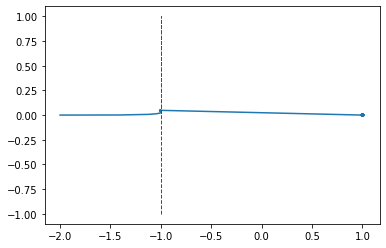

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(x_array, y_array, '-')
plt.plot(line_x_array, line_y_array,color='red',linewidth=1,linestyle='--')

In [5]:
def funcc(x, y):
    x = x + 1
    y = y + 1
    return x,y

In [6]:
a = 1
b = 1
a, b = funcc(a, b)

In [7]:
print(a)

2


In [69]:
math.tan(2)

-2.185039863261519